# "Anomaly Detection using Spatiotemporal Autoencoder"
> "Created using Keras"

- toc: true
- branch: master
- badges: true
- comments: true
- categories: [deep_learning, anomaly_detection]
- image: images/anomaly.png
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2



Starting out with this project, I was confused between a regular classification task and an anomaly detection.

After all anomaly detection should fall under a one-class(binary) classification

However, I realized that collecting data for anomaly detection was the pain-point
It's impossible to get equal data points for anomalies and non-anomalies since anomalies are extreme events

##References

- Yong Shean Chong, Abnormal Event Detection in Videos using Spatiotemporal Autoencoder (2017)
- Mahmudul Hasan, Jonghyun Choi, Jan Neumann, Amit K. Roy-Chowdhury, Learning Temporal Regularity in Video Sequences (2016)
- https://github.com/harshtikuu/Abnormal_Event_Detection (regularity score)
- Learning Temporal Regularity in Video Sequences
Mahmudul Hasan, Jonghyun Choi, Jan Neumann, Amit K. Roy-Chowdhury, Larry S. Davis
- Robust Anomaly Detection in Videos Using Multilevel Representations
Hung Vu et al (interesting paper but didn't get time to implement)

##Pipeline:

- Data preparation
- Feature selection
- Model identification
- Metric identification
- Training and testing

## Data:

For this projecct I use the *[UCSD Anomaly Detection Dataset](http://www.svcl.ucsd.edu/projects/anomaly/dataset.htm)*

It contains two parts:

- Peds1
- Peds2

As per the site description:

> *Peds1: clips of groups of people walking towards and away from the camera, and some amount of perspective distortion. Contains 34 training video samples and 36 testing video samples*

>*Peds2: scenes with pedestrian movement parallel to the camera plane. Contains 16 training video samples and 12 testing video samples.*

Steps to prepare data:

- Resize the image for model ingestion
- Store in a Tensor for GPU computation
- Create a TF dataset pipeline for effective data augmentation and feed the model
- Data augmentation includes taking strides during sampling of the frames from the video e.g. stride 2 would indicate to sample every 2nd frame and so on

<!-- ![](http://www.svcl.ucsd.edu/projects/anomaly/image/dataset/vidf4_33_007_frame080_mark.png)


![](http://www.svcl.ucsd.edu/projects/anomaly/image/dataset/vidf3_33_002_frame110_mark.png) -->

![](https://upload.wikimedia.org/wikipedia/commons/thumb/b/b6/Image_created_with_a_mobile_phone.png/1200px-Image_created_with_a_mobile_phone.png)


##Imports

In [ ]:
# # GPU utilization
# from tensorflow.compat.v1 import ConfigProto
# from tensorflow.compat.v1 import InteractiveSession
# config = ConfigProto()
# config.gpu_options.allow_growth = True
# session = InteractiveSession(config=config)

In [ ]:
import numpy as np
import math
import tensorflow as tf
print(tf.__version__)

2.3.0


In [ ]:
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

Default GPU Device: /device:GPU:0


In [ ]:
AUTO = tf.data.experimental.AUTOTUNE

In [ ]:
path = '/media/orbo-dl/hdd/orbo_projects/anomaly_detection/'
# path = '/content/'
%cd $path

/media/orbo-dl/hdd/orbo_projects/anomaly_detection


## Download data

In [ ]:
'''
Anomaly Detection in Crowded Scenes.
V. Mahadevan, W. Li, V. Bhalodia and N. Vasconcelos.
In Proc. IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 
San Francisco, CA, 2010 
'''


import glob
import os
import tarfile

!wget 'http://www.svcl.ucsd.edu/projects/anomaly/UCSD_Anomaly_Dataset.tar.gz'
tar = tarfile.open("UCSD_Anomaly_Dataset.tar.gz")
tar.extractall()
tar.close()


##config

In [ ]:
BATCH_SIZE = 2
INPUT_SHAPE = 144
LATENT_DIM = 2048
TRAIN_PATH = 'UCSD_Anomaly_Dataset.v1p2/UCSDped1/Train'
TEST_PATH = path + '/UCSD_Anomaly_Dataset.v1p2/UCSDped1/Test/Test032'

##Data preparation

In [ ]:
import numpy as np
import cv2
# from google.colab.patches import cv2_imshow

def add_noise(img):
    '''source: https://gist.github.com/Prasad9/28f6a2df8e8d463c6ddd040f4f6a028a'''
    noise =  np.random.normal(loc=0, scale=1, size=img.shape)
    img2 = img*2
    noisey_image = np.clip(np.where(img2 <= 1, (img2*(1 + noise*0.2)), (1-img2+1)*(1 + noise*0.2)*-1 + 2)/2, 0,1)
    return noisey_image




In [ ]:
import glob
import os
import cv2
import numpy as np
def temporal_augmentation(path, total_strides=3, seq_len=10, noise=False):
    ''' 
    Data augmentation in the temporal dimension
    e.g.stride-1 sequence is made up of frames {1, 2, 3, 4, 5, 6, 7, 8, 9, 10},
        stride-2 sequence is made up of frames {1, 3, 5, 7, 9, 11, 13, 15, 17, 19}, 
        stride-3 sequence is made up of frames {1, 4, 7, 10, 13, 16, 19, 22, 25,28} and so on
    
    @args:
        path (str): path to train data (consists of folders (which consists of frames) of ~2 min videos)
        stride (int): apply stride in temporal sampling
        seq_len (int): len of the input sequence to the model e.g. batch_sizex10x28x28x3
        
    '''

    sequence_frames = []
    for idx, folder in enumerate(glob.glob(path+"/*"), 1): #Train000,Train001,..
        assert os.path.isdir(folder)==True, "[ERROR] not a folder"
        

        frames_in_folder = []
        for frame in sorted(glob.glob(folder+'/*')):
            frame = cv2.imread(frame, 0)
            frame = cv2.resize(frame, (INPUT_SHAPE, INPUT_SHAPE))
            frame = frame/255.
            if noise:
                frame = add_noise(frame)
            frame = np.expand_dims(frame, axis=-1)

            frames_in_folder.append(frame)


        print(len(frames_in_folder))

        temp_seq = []
        for stride in range(1, total_strides):
            # temp_seq = [frames_in_folder[i:seq_len*stride:stride] for i in range(len(frames_in_folder))]
            

            for i in range(0, len(frames_in_folder), seq_len):
                # print('*********')
                # print(i,seq_len*stride,stride)
                temp_arr = frames_in_folder[i:i+seq_len*stride:stride]
                temp_arr = np.array(temp_arr)
                # temp_arr = np.expand_dims(temp_arr, axis=-1)

                # print(temp_arr.shape)
                if temp_arr.shape[0]==seq_len:
                    temp_seq.append(temp_arr)

        print(f'[INFO] processed {folder}')
        

        sequence_frames.extend(temp_seq)
        
    sequence_frames = np.array(sequence_frames)
    print(f'[INFO] generated the sequence with shape {sequence_frames.shape}')

    return sequence_frames



In [ ]:
data = temporal_augmentation(TRAIN_PATH)
# noisy_data = temporal_augmentation(TRAIN_PATH, noise=True)

In [ ]:
# data.shape, noisy_data.shape

In [ ]:
# training_data = np.concatenate((data, noisy_data), axis=0)
training_data = data

In [ ]:
training_data.shape

(2652, 10, 144, 144, 1)

In [ ]:
import cv2
import numpy as np

In [ ]:
# a = np.zeros((len(files),INPUT_SHAPE,INPUT_SHAPE, 1))

# for idx, filename in enumerate(files):
#     img = cv2.imread(filename, 0)
#     img = cv2.resize(img, (INPUT_SHAPE,INPUT_SHAPE))
#     a[idx,:,:, 0] = np.array(img, dtype=np.float32)/255.0

In [ ]:
import tensorflow as tf
# data = tf.convert_to_tensor(data, dtype=tf.float32)


In [ ]:
def make_two(a):
    return a, a

dataset = tf.data.Dataset.from_tensor_slices(training_data)
dataset = dataset.map(make_two)
dataset = dataset.shuffle(2048)
dataset = dataset.batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=BATCH_SIZE)


In [ ]:
# del data, noisy_data, 
# del training_data

In [ ]:
iter(dataset).__next__()[0].shape

TensorShape([2, 10, 144, 144, 1])

## Feature selection

After a thourough literaure survey I came across handcrafted feature selections.. some of which include
- Canny edge detection maps
- Histograms of Oriented Gradients
(HOG)
- Histograms of Optical Flows (HOF)
- Optical flow frames combined with input frames

However, following "Learning Temporal Regularity in Video Sequences
Mahmudul Hasan Jonghyun Choi†
Jan Neumann† Amit K. Roy-Chowdhury Larry S. Davis" it has been proven empirically that even though we use the state-of-the-art motion feature
descriptors, they may not be optimal for learning regular patterns in videos.

As per the paper I decided to use the input frames as it is and supply it to a Deep neural net acrhitecture.

Without much success using regular auto-encoder I decided to use temproal sequences of input frames to learn temporal features as well.

The input sequence consists of 'T' frames stacked together where 'T' is the sequence len.

In order to apply data augmentation to increase volume of input temporal sampling augmentation was applied by concatenating i/p frames with various skipping strides to construct T-sized input cuboid. Three types of cuboids from the video sequences were sampled by using stride-1, stride-2, and stride-3.




## Model identification and Metrics

In order to find a suitable architecture I created a vanilla sptial auto-encoder.
Individual frames were supplied to the model and the mteric used to identify anomaly was the reconstruction error (L2 norm of model output and input frame[Euclidean distance])

In order to improve the accuracy a spatio-temporal autoencoder was implemented following the  paper "Abnormal Event Detection in Videos
using Spatiotemporal Autoencoder"

The structure is as follows:
![](https://storage.googleapis.com/groundai-web-prod/media%2Fusers%2Fuser_257266%2Fproject_49169%2Fimages%2Fours_spatial.png)


Based on the reconstruction error a threshold can be set to determine how sensitive the detections are to anomalies (Regularity score)

Once the ground truth can be classified manually into anomaly/non-anomaly frames we can use the area under the receiver operating characteristic (ROC) curve (AUC) to find the perfect threshold (I coudn't get my hands on manually classified frames)

For training I used Adam optimizer to allow it taking the role of setting the learning rate automatically based on the models weight update history




## Spatial  Auto Encoder

In [ ]:
import cv2
import numpy as np
import glob

In [ ]:
files = glob.glob(TRAIN_PATH+'/*/*')
len(files)

6800

In [ ]:
data = np.zeros((len(files),INPUT_SHAPE,INPUT_SHAPE, 1))

for idx, filename in enumerate(files):
    img = cv2.imread(filename, 0)
    img = cv2.resize(img, (INPUT_SHAPE,INPUT_SHAPE))
    img = img/255.
    data[idx,:,:, 0] = np.array(img, dtype=np.float32)

In [ ]:
noisy_data = np.zeros((len(files),INPUT_SHAPE,INPUT_SHAPE, 1))

for idx, filename in enumerate(files):
    img = cv2.imread(filename, 0)
    img = cv2.resize(img, (INPUT_SHAPE,INPUT_SHAPE))
    img = img/255.
    img = add_noise(img)
    noisy_data[idx,:,:, 0] = np.array(img, dtype=np.float32)

In [ ]:
training_data = np.concatenate((data, noisy_data), axis=0)


In [ ]:
import tensorflow as tf
data = tf.convert_to_tensor(data, dtype=tf.float32)


In [ ]:
def make_two(a):
    return a, a
BATCH_SIZE = 16

dataset = tf.data.Dataset.from_tensor_slices(training_data)
dataset = dataset.map(make_two)
dataset = dataset.shuffle(2048)
dataset = dataset.batch(BATCH_SIZE)
dataset = dataset.prefetch(AUTO)

In [ ]:
iter(dataset).__next__()[0].shape

TensorShape([16, 144, 144, 1])

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import Input, AveragePooling2D, UpSampling2D

def st_ae():
    
    channel_num = 1
    input_tensor = Input(shape=(INPUT_SHAPE, INPUT_SHAPE, channel_num))

    conv1 = Conv2D(128, kernel_size=(7, 7), padding='same', name='conv1', activation='relu')(input_tensor)
    conv1 = AveragePooling2D((2,2), padding='same')(conv1)

    conv2 = Conv2D(64, kernel_size=(3, 3), padding='same', strides=(2, 2), name='conv2', activation='relu')(conv1)
    conv2 = AveragePooling2D((2, 2), padding='same')(conv2)

    conv3 = Conv2D(32, kernel_size=(3, 3), padding='same', strides=(1, 1), name='conv3', activation='relu')(conv2)
    conv3 = AveragePooling2D((2, 2), padding='same')(conv3)

    deconv1 = Conv2D(32, kernel_size=(3, 3), padding='same', strides=(1, 1), name='deconv1', activation='relu')(conv3)
    deconv1 = UpSampling2D((2, 2))(deconv1)

    deconv2 = Conv2D(32, kernel_size=(3, 3), padding='same', strides=(1, 1), name='deconv2', activation='relu')(deconv1)
    deconv2 = UpSampling2D((2, 2))(deconv2)

    deconv3 = Conv2D(64, kernel_size=(3, 3), padding='same', strides=(1, 1), name='deconv3', activation='relu')(deconv2)
    deconv3 = UpSampling2D((2, 2))(deconv3)

    deconv4 = Conv2D(64, kernel_size=(3, 3), padding='same', strides=(1, 1), name='deconv4', activation='relu')(deconv3)
    deconv4 = UpSampling2D((2, 2))(deconv4)

    decoded = Conv2D(channel_num, kernel_size=(3, 3), padding='same', strides=(1, 1), name='deconvAAAA', activation="sigmoid")(deconv4)

    return Model(inputs=input_tensor, outputs=decoded)

In [ ]:
model = st_ae()
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 144, 144, 1)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 144, 144, 128)     6400      
_________________________________________________________________
average_pooling2d (AveragePo (None, 72, 72, 128)       0         
_________________________________________________________________
conv2 (Conv2D)               (None, 36, 36, 64)        73792     
_________________________________________________________________
average_pooling2d_1 (Average (None, 18, 18, 64)        0         
_________________________________________________________________
conv3 (Conv2D)               (None, 18, 18, 32)        18464     
_________________________________________________________________
average_pooling2d_2 (Average (None, 9, 9, 32)         

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
filepath = './anomaly_st_ae_with_noise.h5'
checkpoint = ModelCheckpoint(filepath, 
                             monitor='loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min')
callbacks = [checkpoint]

In [ ]:
model = tf.keras.models.load_model(filepath)

##Conv-LSTM temporal autoencoder (Spatiotemporal)

In [ ]:
from tensorflow.keras.layers import Conv2DTranspose, ConvLSTM2D, BatchNormalization, TimeDistributed, Conv2D, LayerNormalization, Activation
# from keras_layer_normalization import LayerNormalization


In [ ]:
model = tf.keras.models.Sequential()

"""Spatial Encoder with temporal seq (Time Distributed)"""
model.add(TimeDistributed(Conv2D(128, (11, 11), strides=4, padding="same"), batch_input_shape=(None, 10, 144, 144, 1)))
model.add(LayerNormalization())
model.add(TimeDistributed(Conv2D(64, (5, 5), strides=2, padding="same")))
model.add(LayerNormalization())

"""
Conv-LSTM bottleneck
"""
model.add(ConvLSTM2D(64, (3, 3), padding="same", return_sequences=True))
model.add(LayerNormalization())
model.add(ConvLSTM2D(32, (3, 3), padding="same", return_sequences=True))
model.add(LayerNormalization())
model.add(ConvLSTM2D(64, (3, 3), padding="same", return_sequences=True))
model.add(LayerNormalization())

"""Spatial Decoder with temporal seq (Time Distributed)"""
model.add(TimeDistributed(Conv2DTranspose(64, (5, 5), strides=2, padding="same")))
model.add(LayerNormalization())
model.add(TimeDistributed(Conv2DTranspose(128, (11, 11), strides=4, padding="same")))
model.add(LayerNormalization())
model.add(TimeDistributed(Conv2D(1, (11, 11), activation="sigmoid", padding="same")))

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_43 (TimeDis (None, 10, 36, 36, 128)   15616     
_________________________________________________________________
layer_normalization_7 (Layer (None, 10, 36, 36, 128)   256       
_________________________________________________________________
time_distributed_44 (TimeDis (None, 10, 18, 18, 64)    204864    
_________________________________________________________________
layer_normalization_8 (Layer (None, 10, 18, 18, 64)    128       
_________________________________________________________________
conv_lst_m2d_9 (ConvLSTM2D)  (None, 10, 18, 18, 64)    295168    
_________________________________________________________________
layer_normalization_9 (Layer (None, 10, 18, 18, 64)    128       
_________________________________________________________________
conv_lst_m2d_10 (ConvLSTM2D) (None, 10, 18, 18, 32)   

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
filepath = './anomaly_lstm_without_noise.h5'
checkpoint = ModelCheckpoint(filepath, 
                             monitor='loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min')
callbacks = [checkpoint]

In [ ]:
model = tf.keras.models.load_model(filepath)

## Training

In [ ]:
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(lr=1e-4, decay=1e-5, epsilon=1e-6), metrics=[tf.keras.metrics.MeanSquaredError()])
model.fit(dataset, epochs=10, callbacks=callbacks)

Epoch 1/10
1326/1326 [==============================] - ETA: 0s - loss: 0.0125 - mean_squared_error: 0.0125
Epoch 00001: loss improved from inf to 0.01254, saving model to ./anomaly_lstm(BN+relu+no_final_signoid)_without_noise.h5
1326/1326 [==============================] - 166s 125ms/step - loss: 0.0125 - mean_squared_error: 0.0125
Epoch 2/10
1326/1326 [==============================] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052
Epoch 00002: loss improved from 0.01254 to 0.00515, saving model to ./anomaly_lstm(BN+relu+no_final_signoid)_without_noise.h5
1326/1326 [==============================] - 167s 126ms/step - loss: 0.0052 - mean_squared_error: 0.0052
Epoch 3/10
1326/1326 [==============================] - ETA: 0s - loss: 0.0041 - mean_squared_error: 0.0041
Epoch 00003: loss improved from 0.00515 to 0.00408, saving model to ./anomaly_lstm(BN+relu+no_final_signoid)_without_noise.h5
1326/1326 [==============================] - 166s 125ms/step - loss: 0.0041 - mean_squared_e

In [ ]:
model.save('anomaly_v1.h5')

In [ ]:
# model = tf.keras.models.load_model('anomaly.h5')
# model.summary()

Regularity score:


In [ ]:
TEST_PATH = path + '/UCSD_Anomaly_Dataset.v1p2/UCSDped1/Test/Test024'

In [ ]:
from PIL import Image
import os
def get_test_data():
    sz = 200
    test = np.zeros(shape=(sz, INPUT_SHAPE, INPUT_SHAPE, 1))
    cnt = 0
    for f in sorted(os.listdir(TEST_PATH)):
        if str(os.path.join(TEST_PATH, f))[-3:] == "tif":

            img = cv2.imread(os.path.join(TEST_PATH, f), 0)
            img = cv2.resize(img, (INPUT_SHAPE, INPUT_SHAPE))
            img = img/255.
            test[cnt, :, :, 0] = img
            cnt = cnt + 1
    return test


(200, 144, 144, 1)


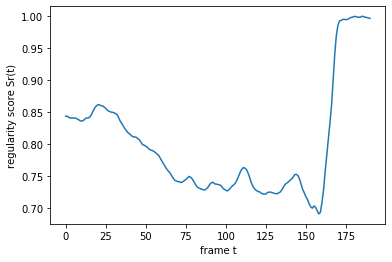

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

seq_len = 10
test = get_test_data()
print(test.shape)
sz = test.shape[0] - seq_len + 1
sequences = np.zeros((sz, seq_len, INPUT_SHAPE, INPUT_SHAPE, 1))

# apply the sliding window technique to get the sequences
for i in range(0, sz):
    clip = np.zeros((seq_len, INPUT_SHAPE, INPUT_SHAPE, 1))
    for j in range(0, seq_len):
        clip[j] = test[i + j, :, :, :]
    sequences[i] = clip


# get the reconstruction cost of all the sequences
reconstructed_sequences = model.predict(sequences, batch_size=4)
sequences_reconstruction_cost = np.array([np.linalg.norm(np.subtract(sequences[i],reconstructed_sequences[i])) for i in range(0,sz)])
sa = (sequences_reconstruction_cost - np.min(sequences_reconstruction_cost)) / np.max(sequences_reconstruction_cost)
sr = 1.0 - sa

# plot the regularity scores
plt.plot(sr)
plt.ylabel('regularity score Sr(t)')
plt.xlabel('frame t')
plt.show()



## Testing

In [ ]:
import glob
import os
import cv2
import numpy as np
def generate_test_data(folder, stride=1, seq_len=10, noise=False):
    ''' 
    Generate test data (Split video to sequnces 10 frames long)
        
    '''


    frames_in_folder = []
    for frame in sorted(glob.glob(folder+'/*')):
        # print(frame)
        frame = cv2.imread(frame, 0)
        frame = cv2.resize(frame, (INPUT_SHAPE, INPUT_SHAPE))
        frame = frame/255.
        frame = np.expand_dims(frame, axis=-1)

        frames_in_folder.append(frame)


    print(len(frames_in_folder))

    temp_seq = []


    for i in range(0, len(frames_in_folder), seq_len):
        # print('*********')
        temp_arr = frames_in_folder[i:i+seq_len*stride:stride]
        temp_arr = np.array(temp_arr)

        # print(temp_arr.shape)
        if temp_arr.shape[0]==seq_len:
            temp_seq.append(temp_arr)

    print(f'[INFO] processed {folder}')
    return np.array(temp_seq)




In [ ]:
TEST_PATH = path + '/UCSD_Anomaly_Dataset.v1p2/UCSDped1/Test/Test024'
testing_data = generate_test_data(TEST_PATH)

200
[INFO] processed /media/orbo-dl/hdd/orbo_projects/anomaly_detection//UCSD_Anomaly_Dataset.v1p2/UCSDped1/Test/Test024


In [ ]:
testing_data.shape

(20, 10, 144, 144, 1)

0 ------------------------
(10, 144, 144)


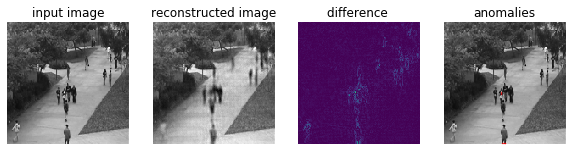

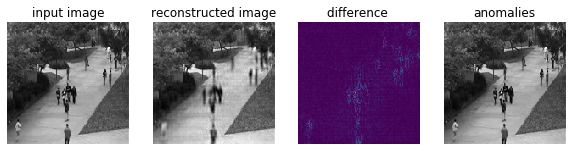

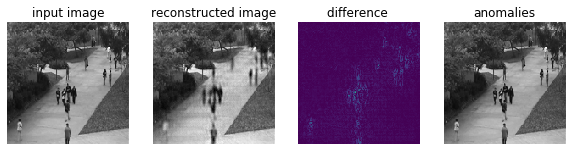

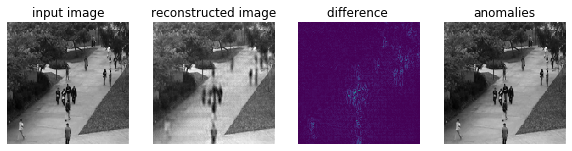

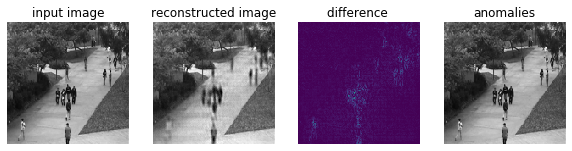

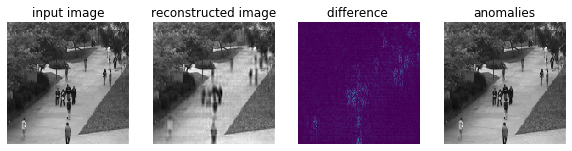

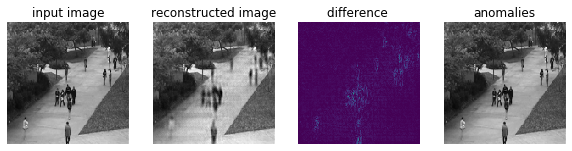

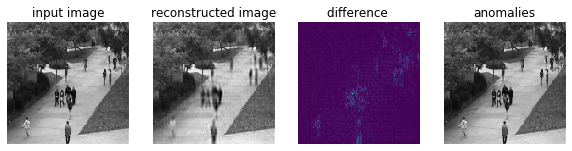

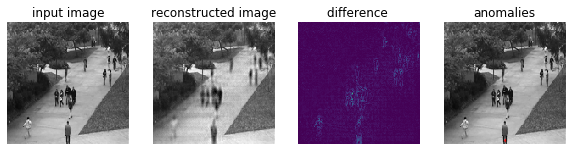

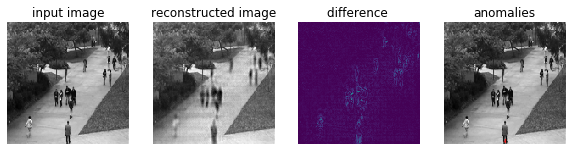

1 ------------------------
(10, 144, 144)


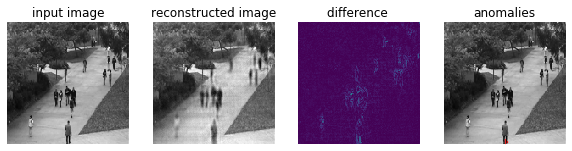

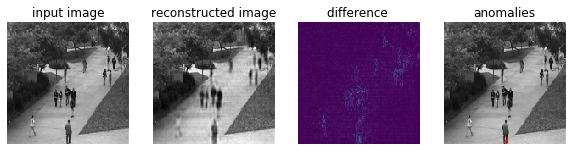

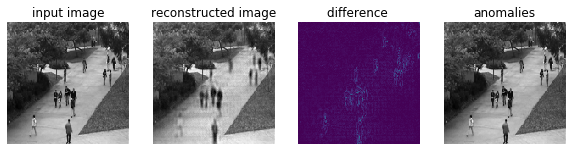

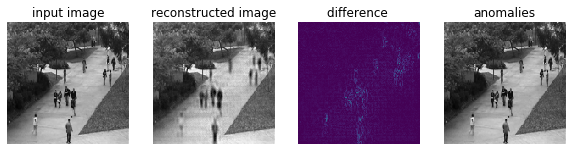

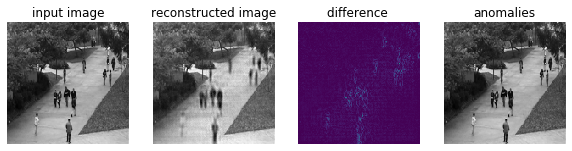

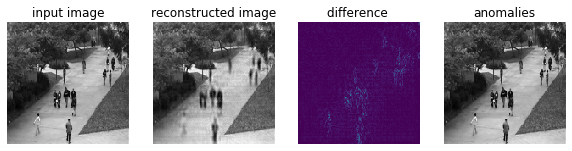

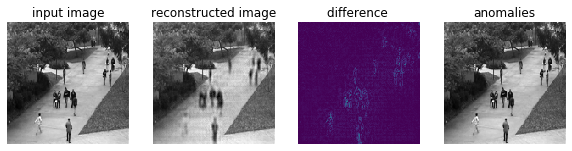

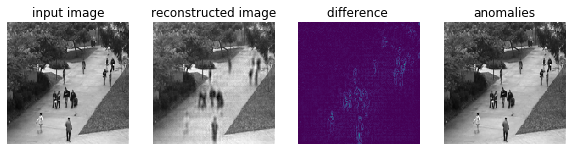

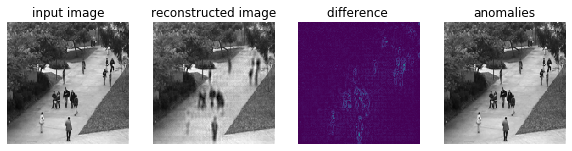

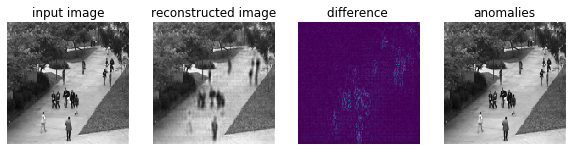

2 ------------------------
(10, 144, 144)


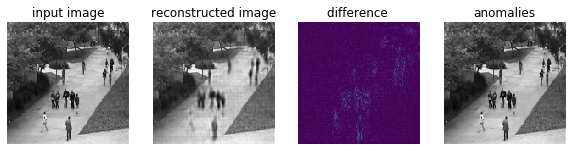

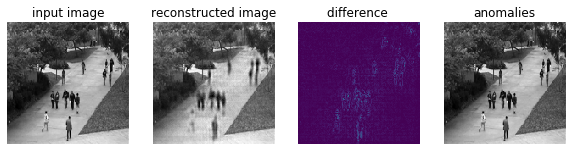

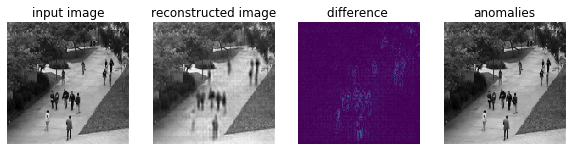

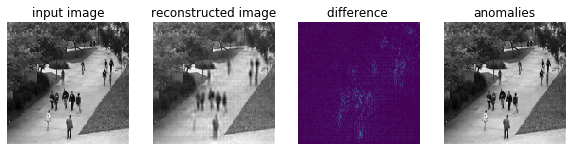

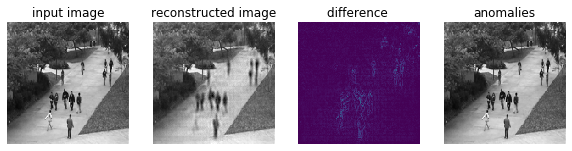

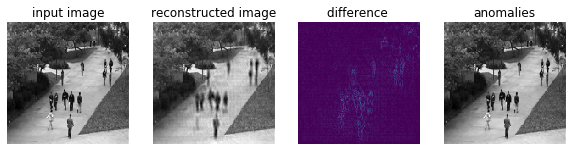

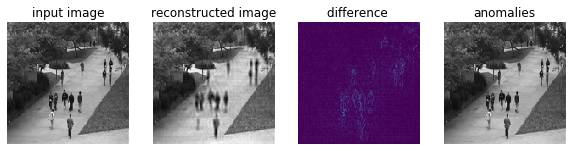

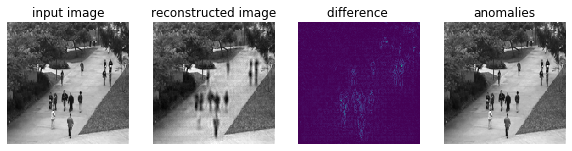

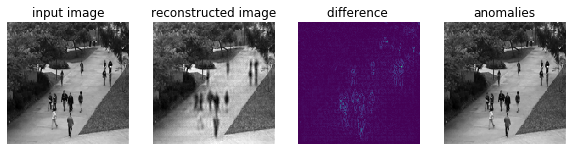

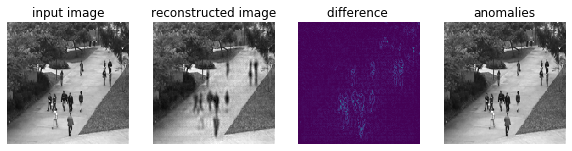

3 ------------------------
(10, 144, 144)


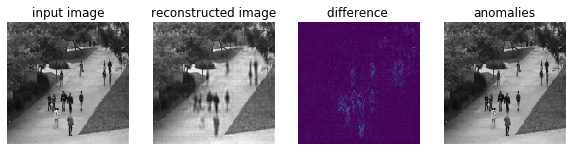

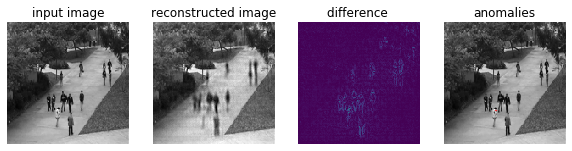

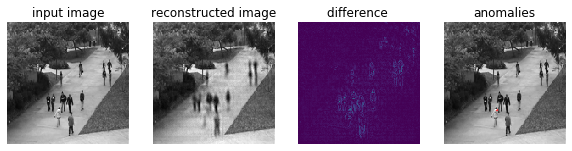

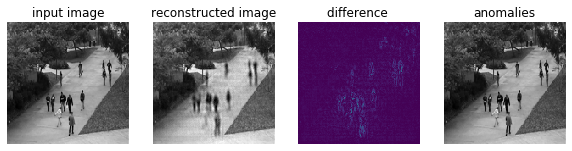

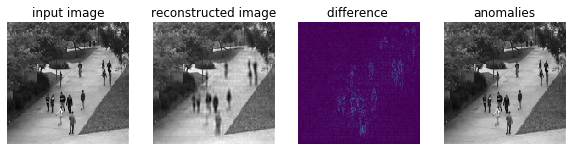

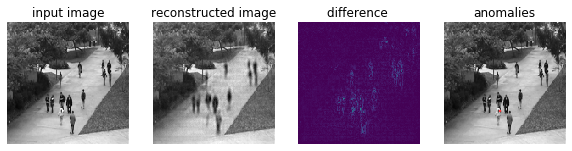

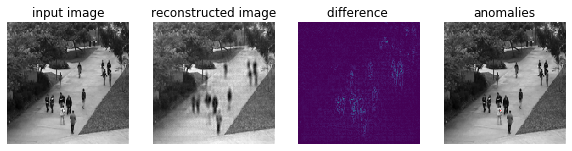

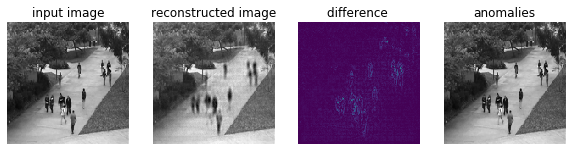

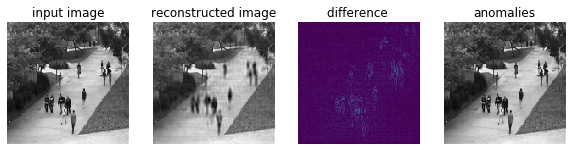

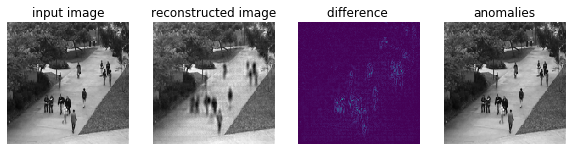

4 ------------------------
(10, 144, 144)


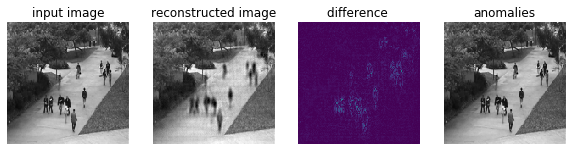

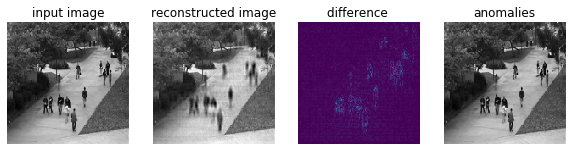

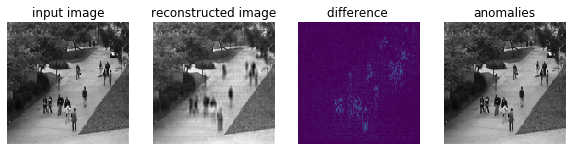

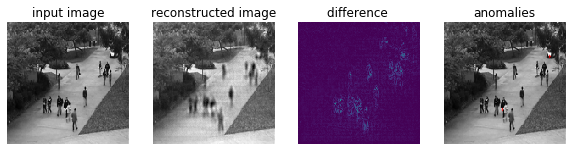

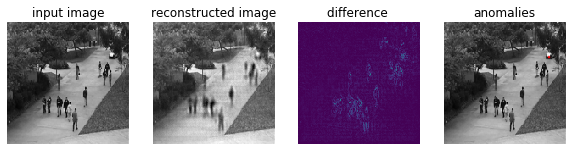

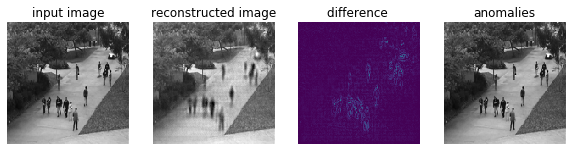

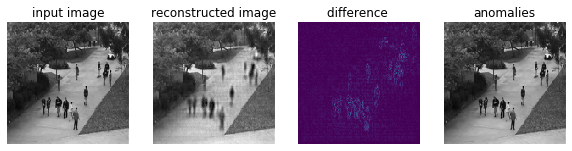

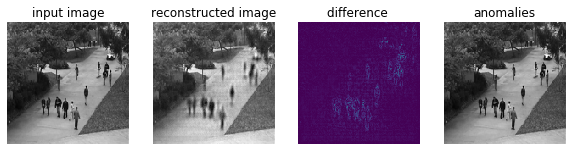

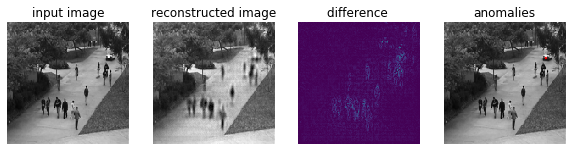

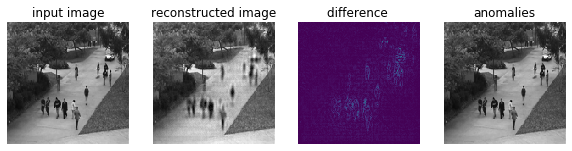

5 ------------------------
(10, 144, 144)


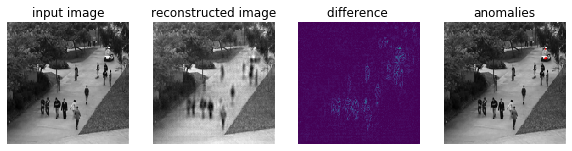

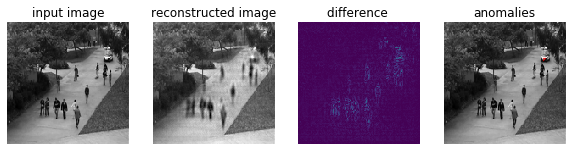

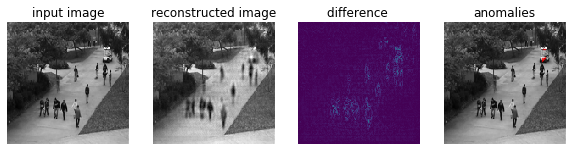

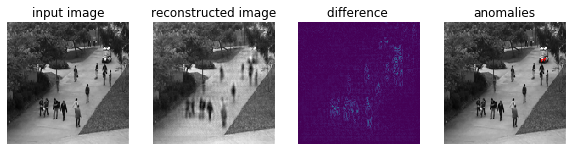

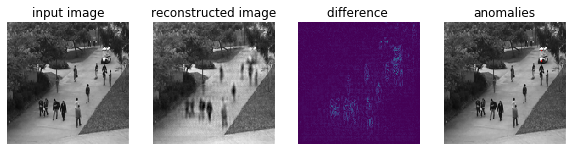

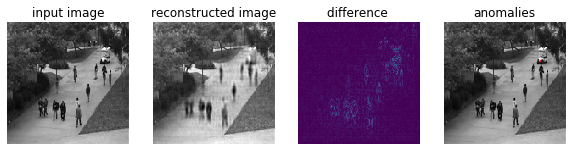

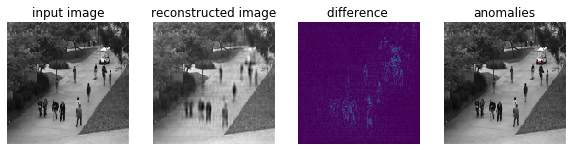

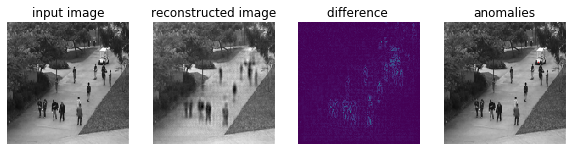

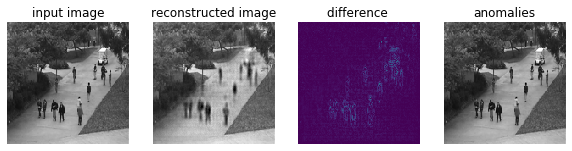

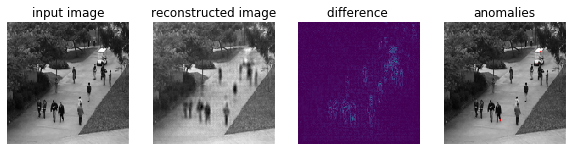

6 ------------------------
(10, 144, 144)


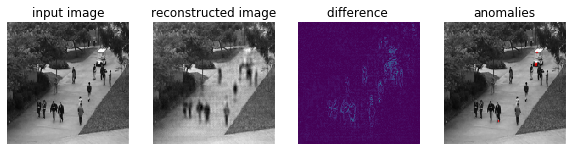

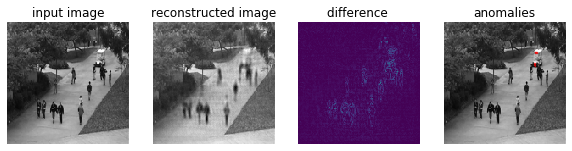

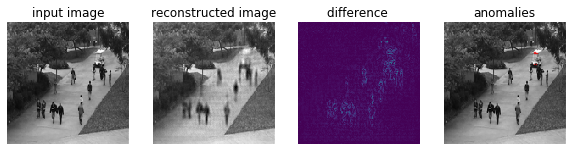

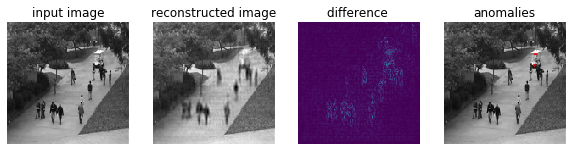

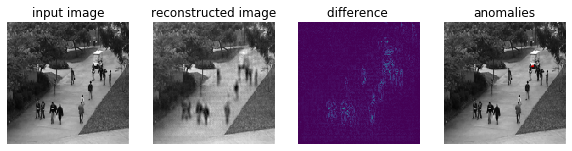

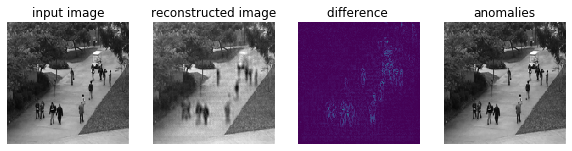

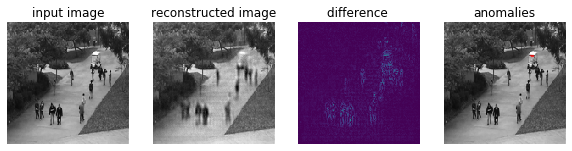

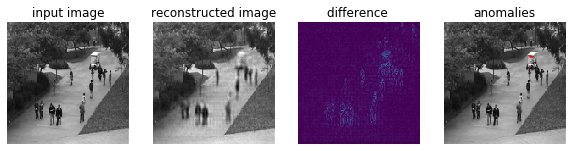

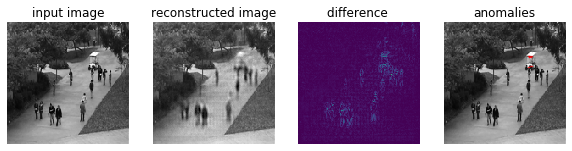

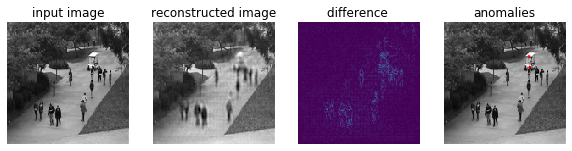

7 ------------------------
(10, 144, 144)


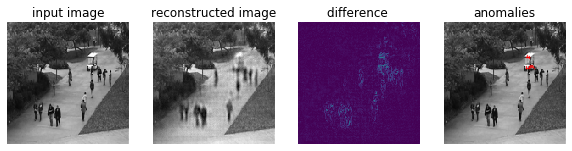

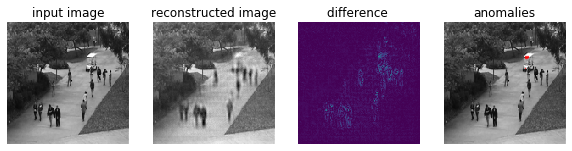

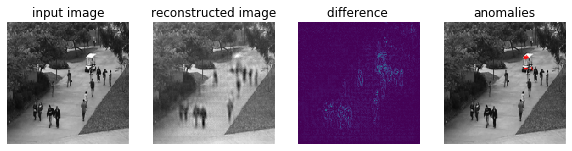

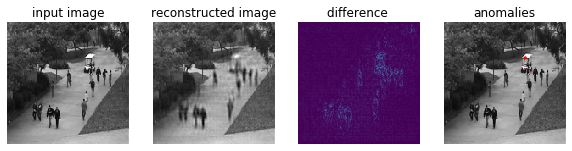

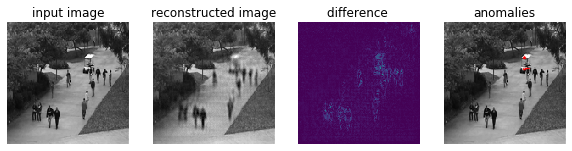

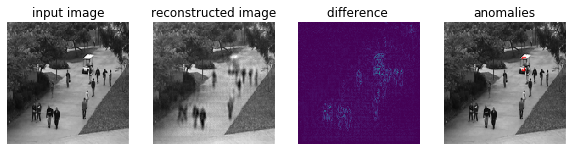

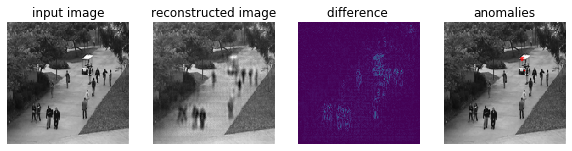

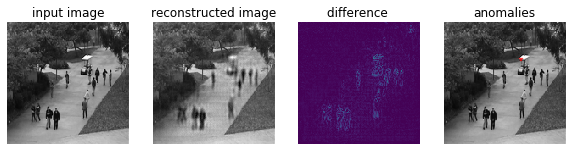

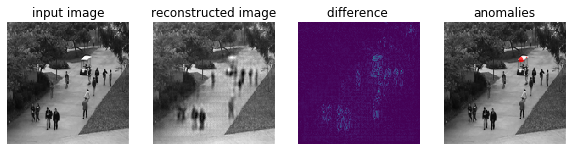

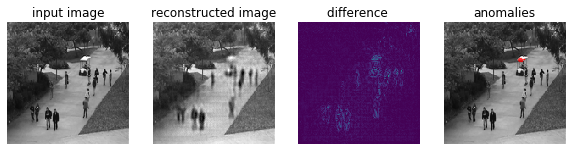

8 ------------------------
(10, 144, 144)


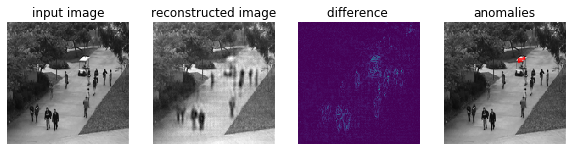

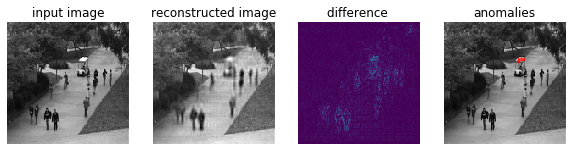

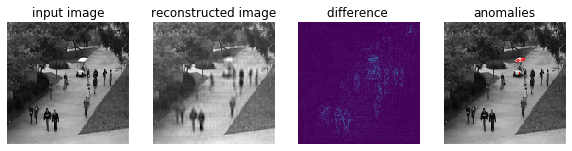

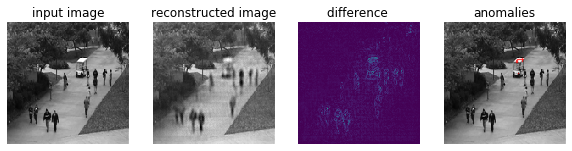

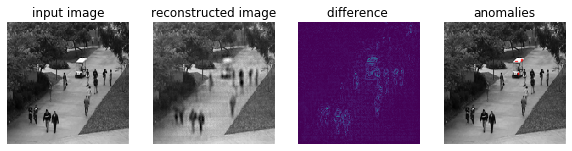

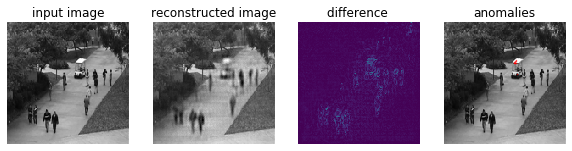

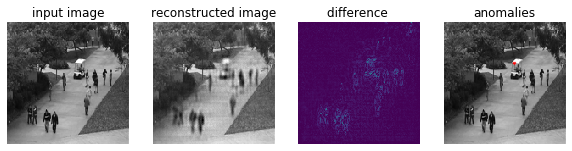

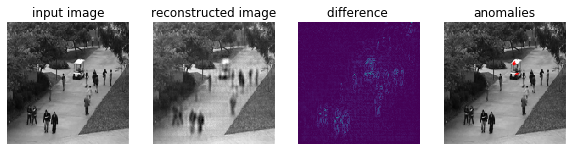

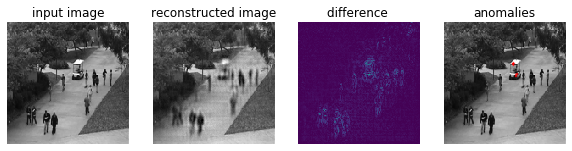

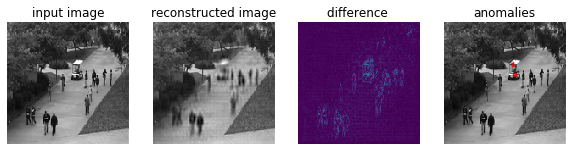

9 ------------------------
(10, 144, 144)


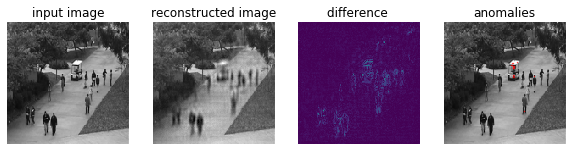

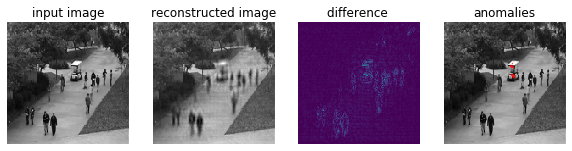

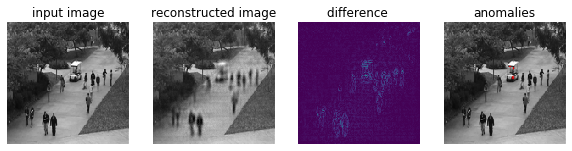

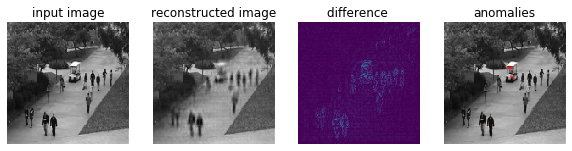

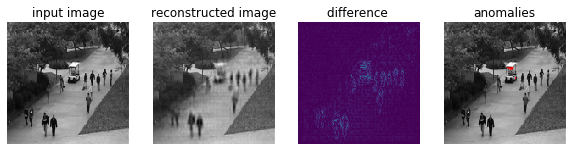

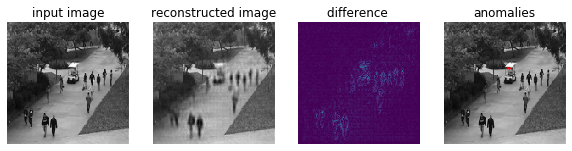

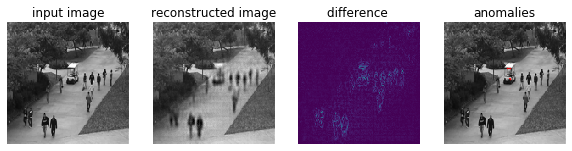

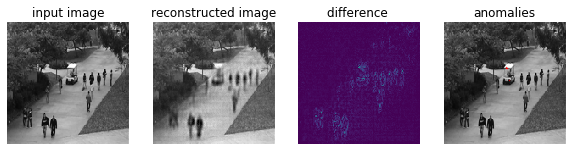

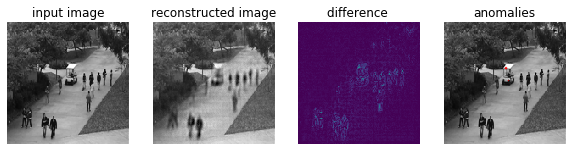

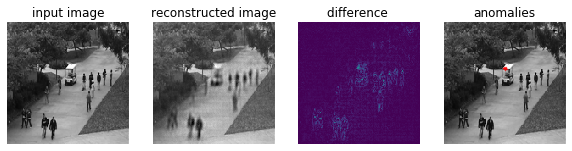

10 ------------------------
(10, 144, 144)


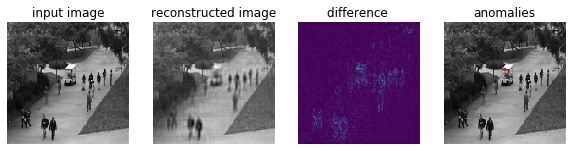

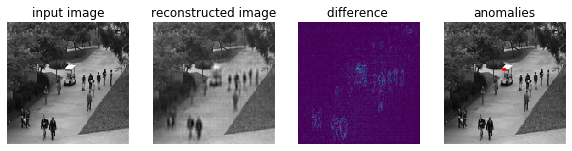

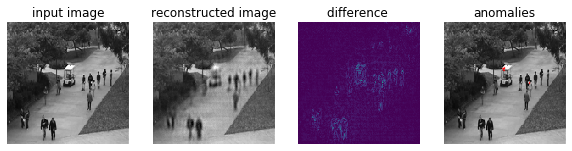

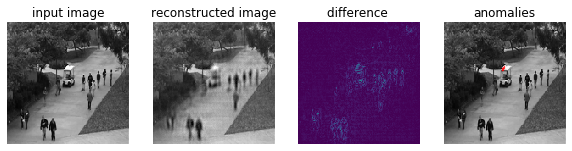

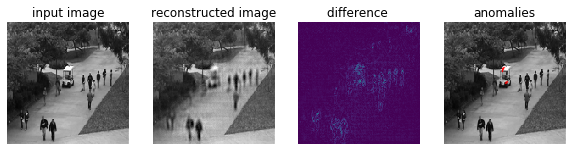

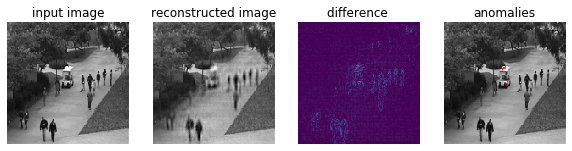

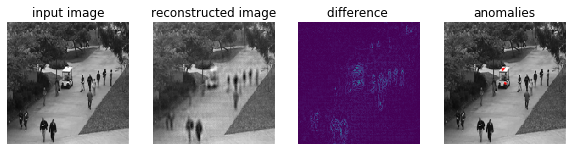

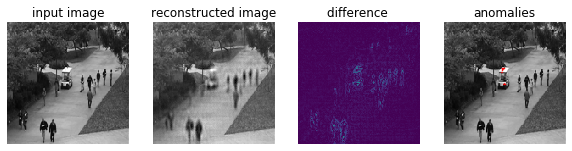

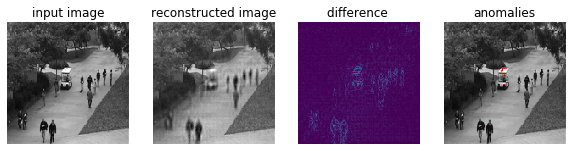

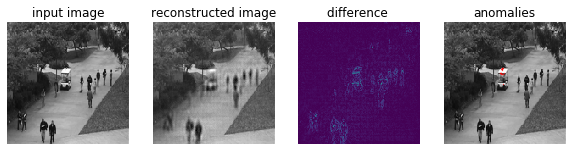

11 ------------------------
(10, 144, 144)


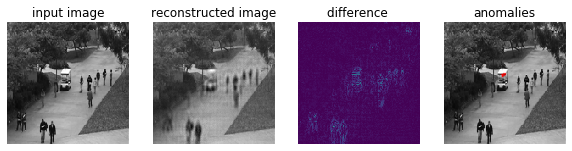

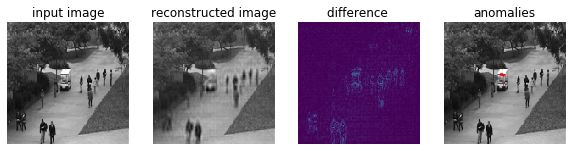

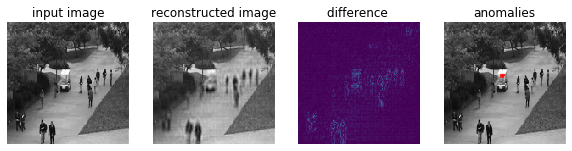

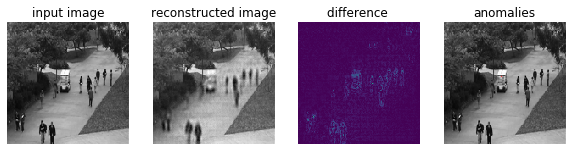

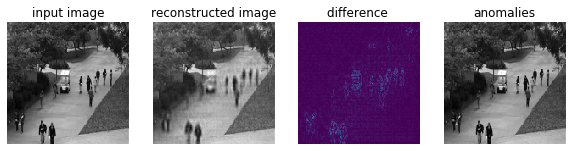

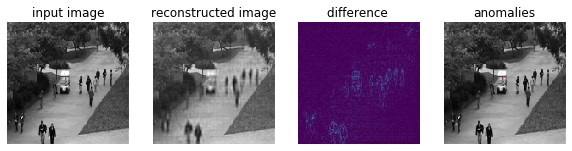

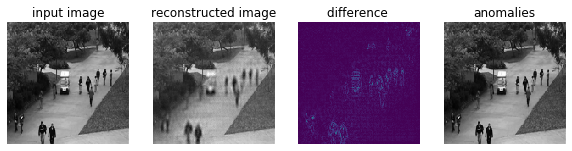

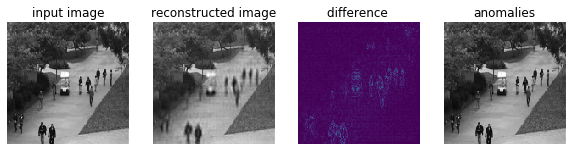

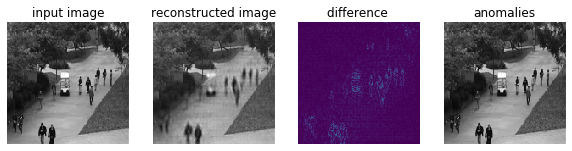

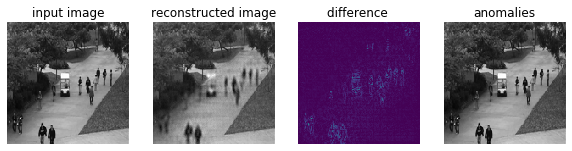

12 ------------------------
(10, 144, 144)


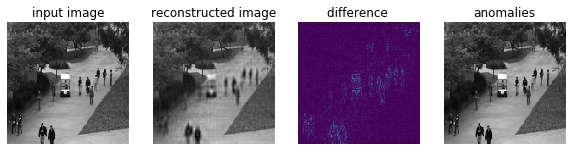

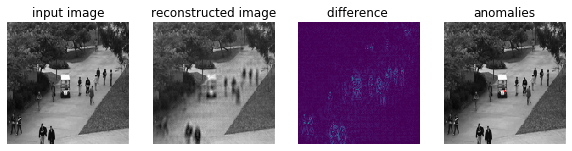

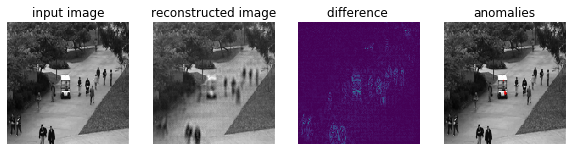

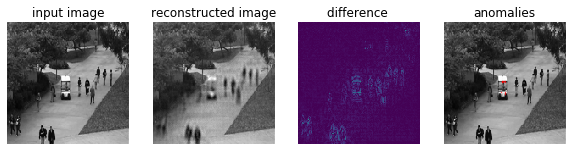

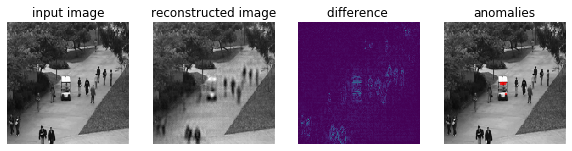

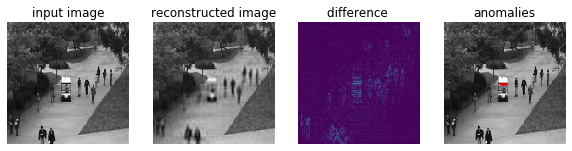

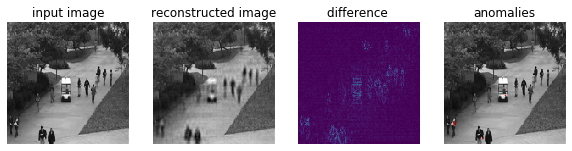

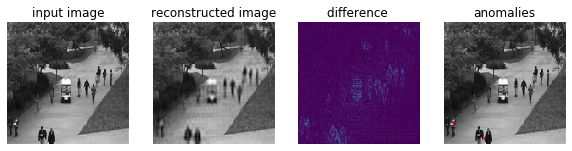

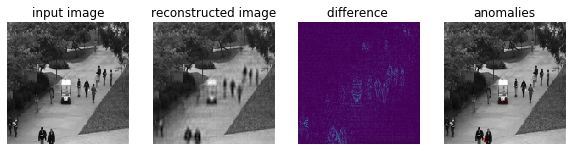

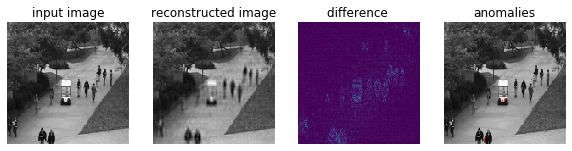

13 ------------------------
(10, 144, 144)


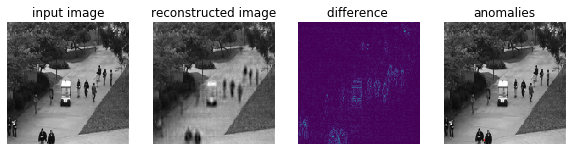

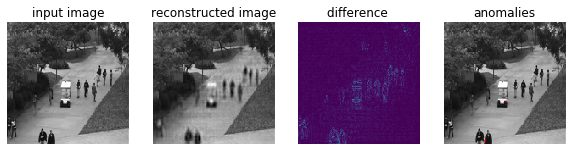

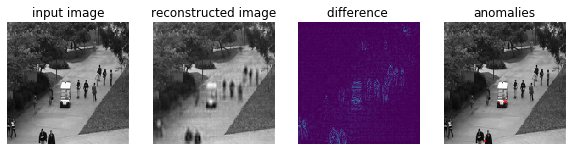

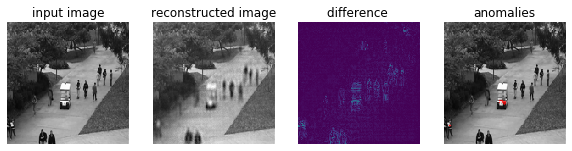

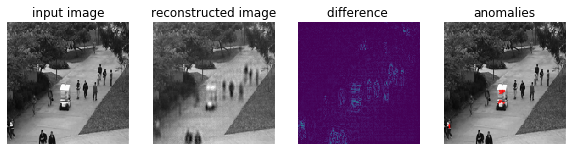

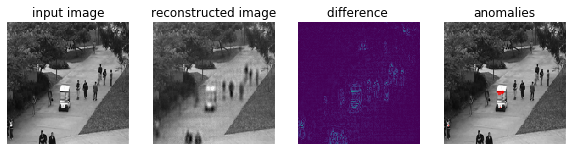

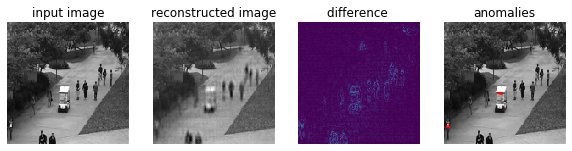

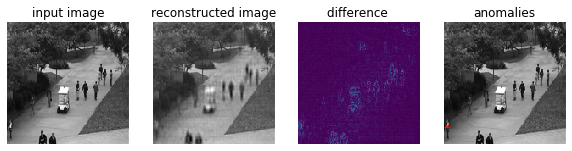

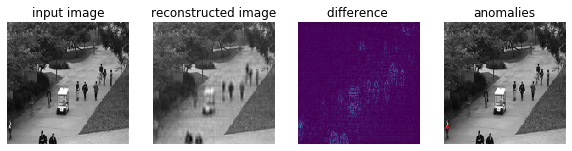

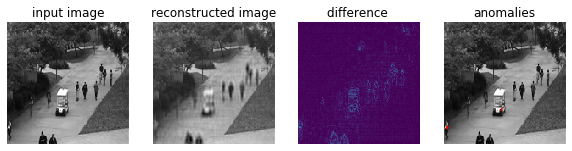

14 ------------------------
(10, 144, 144)


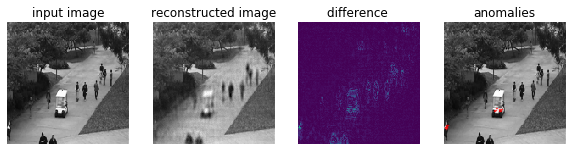

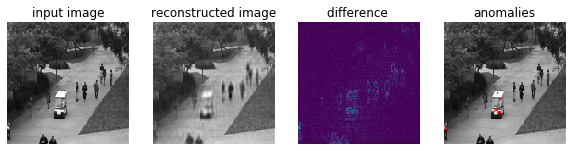

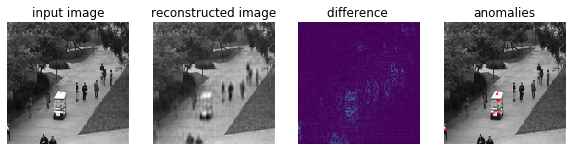

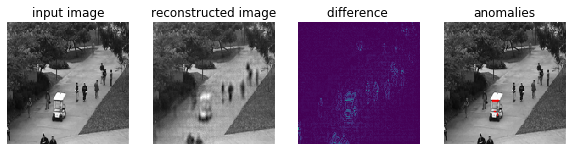

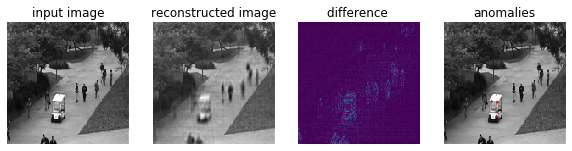

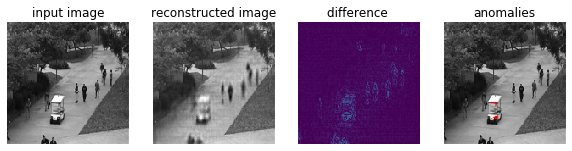

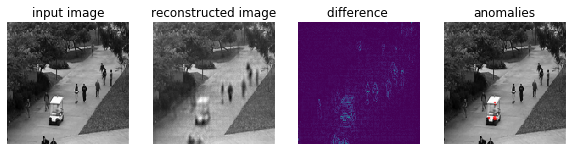

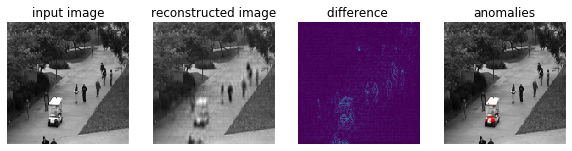

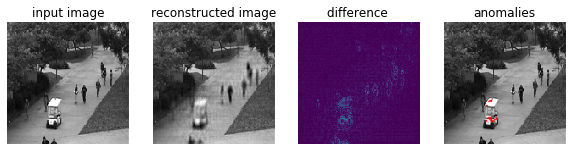

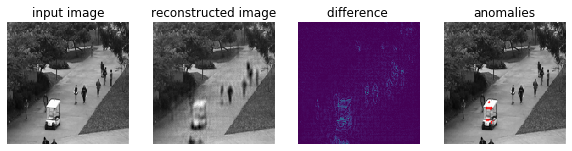

15 ------------------------
(10, 144, 144)


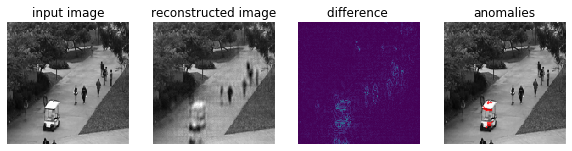

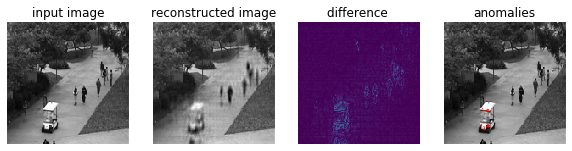

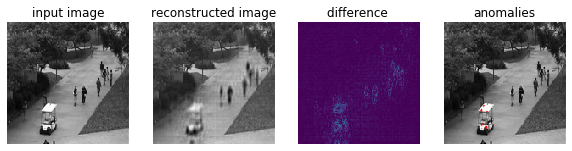

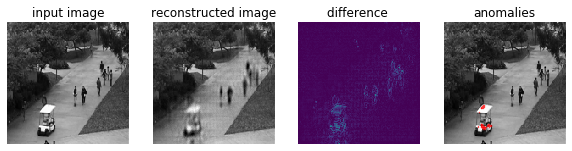

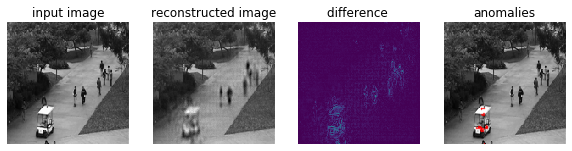

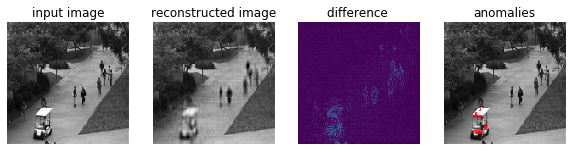

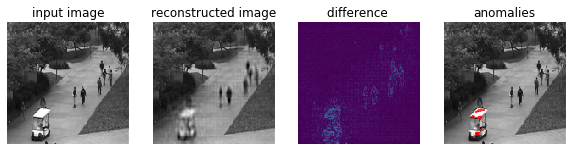

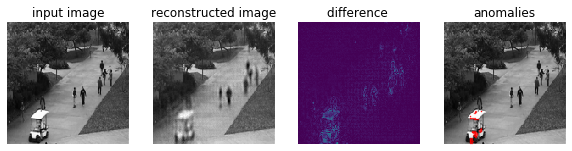

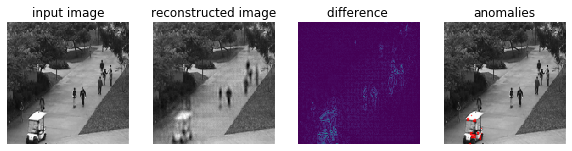

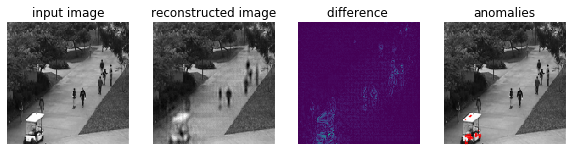

16 ------------------------
(10, 144, 144)


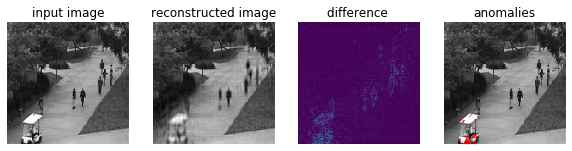

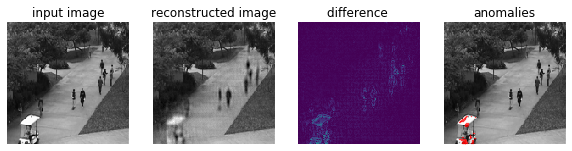

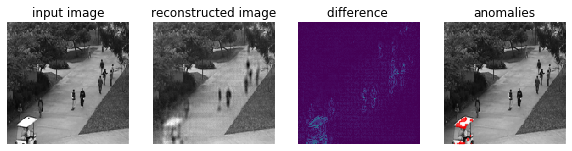

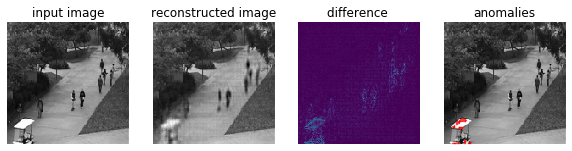

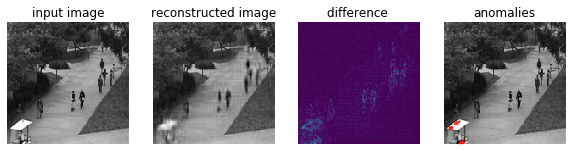

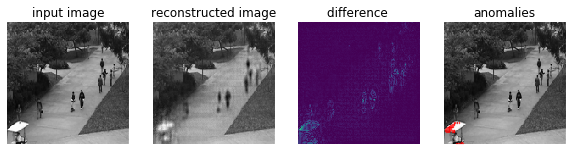

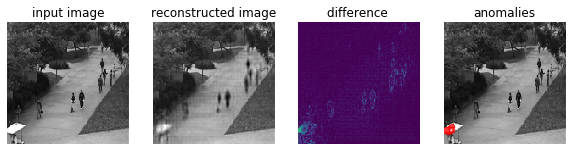

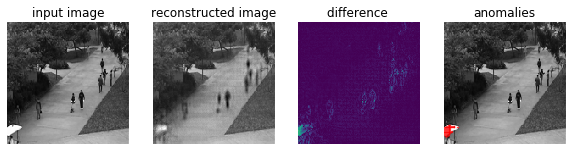

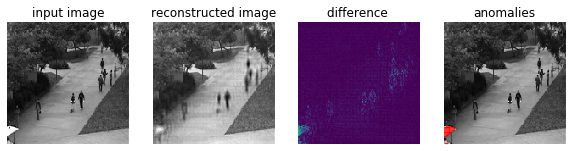

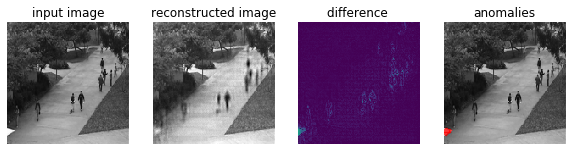

17 ------------------------
(10, 144, 144)


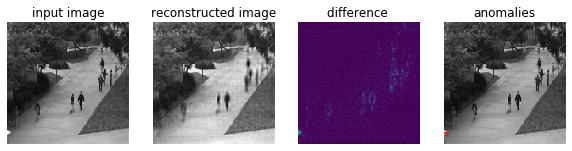

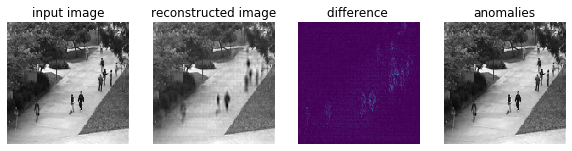

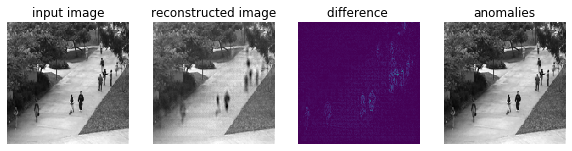

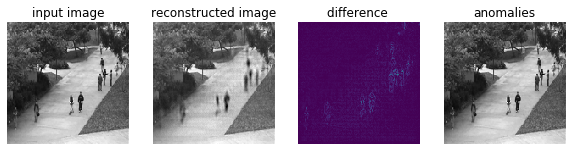

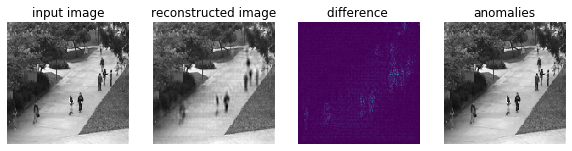

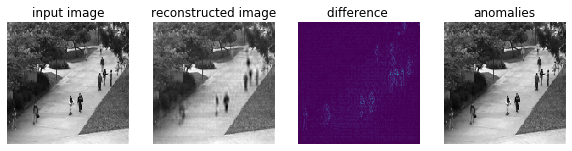

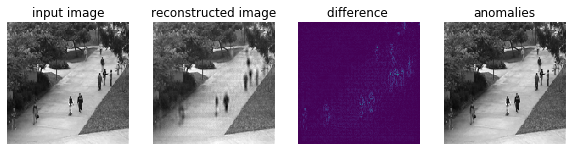

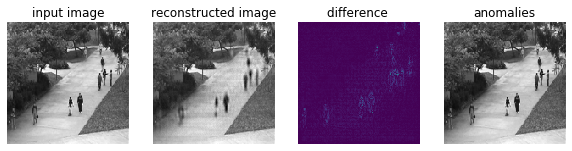

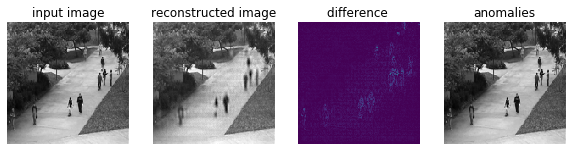

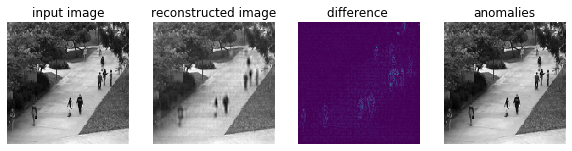

18 ------------------------
(10, 144, 144)


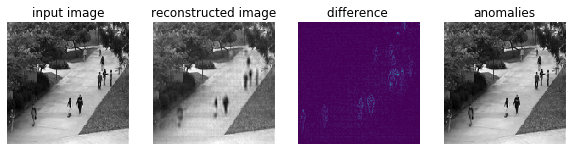

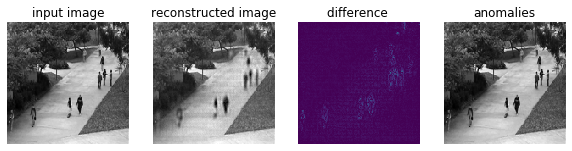

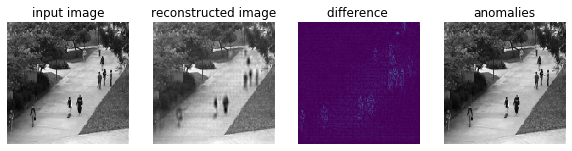

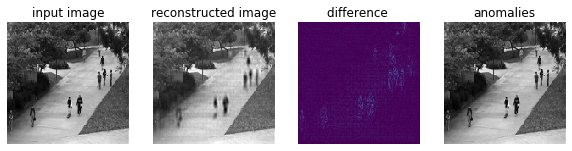

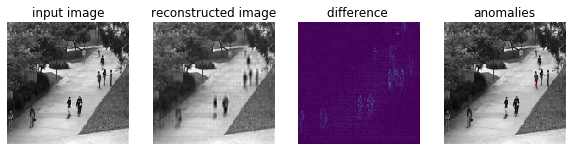

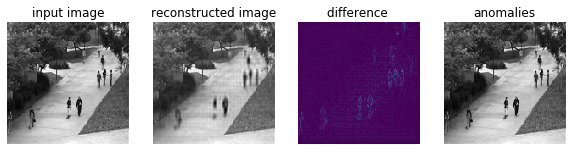

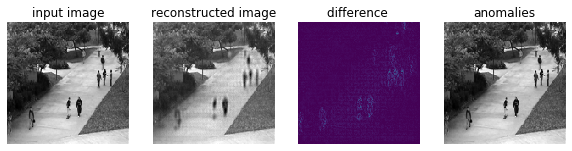

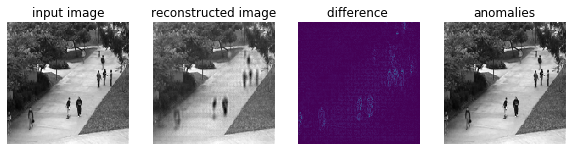

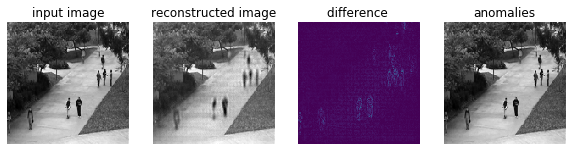

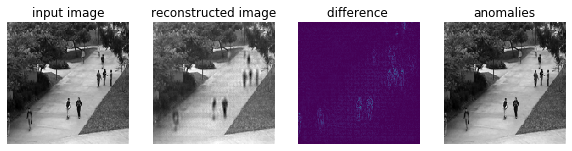

19 ------------------------
(10, 144, 144)


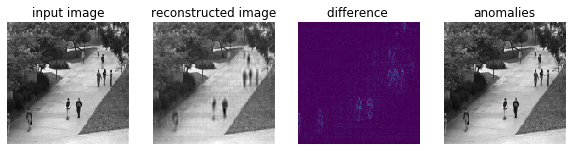

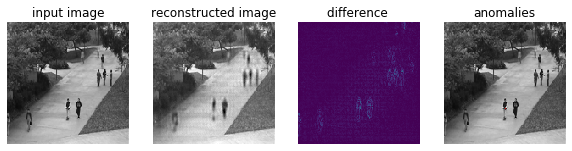

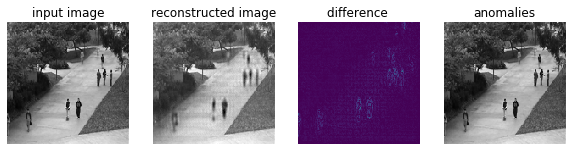

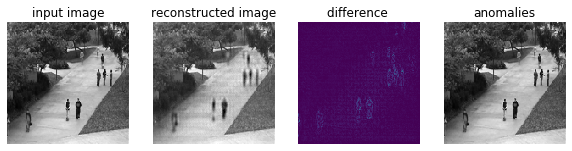

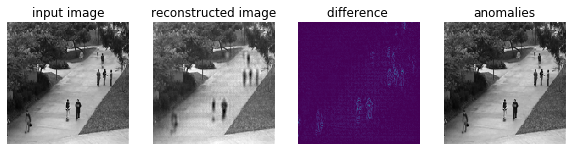

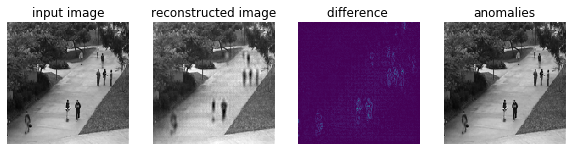

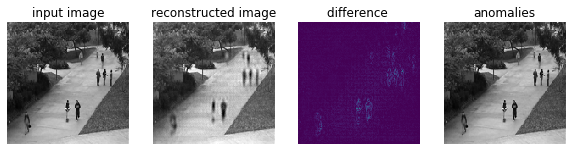

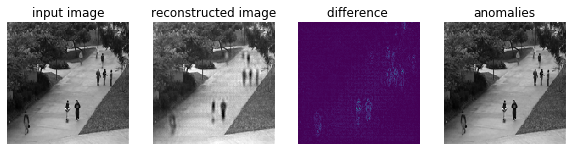

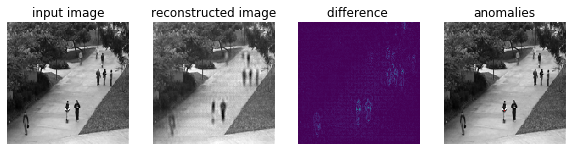

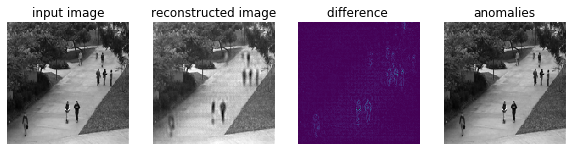

In [ ]:
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline


threshold = 3*255

def plot(img, output, diff, H, threshold, counter):
    
    fig, (ax0, ax1, ax2,ax3) = plt.subplots(ncols=4, figsize=(10, 5))
    ax0.set_axis_off()
    ax1.set_axis_off()
    ax2.set_axis_off()
    
    ax0.set_title('input image')
    ax1.set_title('reconstructed image')
    ax2.set_title('difference ')
    ax3.set_title('anomalies')
    
    ax0.imshow(img, cmap=plt.cm.gray, interpolation='nearest') 
    ax1.imshow(output, cmap=plt.cm.gray, interpolation='nearest')   
    ax2.imshow(diff, cmap=plt.cm.viridis, vmin=0, vmax=255, interpolation='nearest')  
    ax3.imshow(img, cmap=plt.cm.gray, interpolation='nearest')
    
    x,y = np.where(H > threshold)
    ax3.scatter(y,x,color='red',s=0.1) 

    plt.axis('off')
    plt.savefig(os.path.join(output_directory, 'frame_{:03d}.png'.format(counter+1)))
    plt.show()
    

output_directory = './frames'
os.makedirs(output_directory, exist_ok=True)

counter = 0
for idx, index in enumerate(range(testing_data.shape[0])):
    input_seq = testing_data[index, :,:,:]
    print(idx, "------------------------")
    output_seq = model.predict(np.expand_dims(input_seq, axis=0))
    output_seq = np.squeeze(output_seq)
    print(output_seq.shape)
    # output_seq = output_seq.numpy()

    for i in range(output_seq.shape[0]):
        input_img = np.squeeze(input_seq[i])
        output_img = np.squeeze(output_seq[i])

        # plt.imshow(np.hstack((input_img, output_img)))
        output = output_img*255
        input = input_img*255
        diff = np.abs(output-input)
        
        H = signal.convolve2d(diff, np.ones((4,4)), mode='same')
        plot(input, output, diff, H, threshold, counter)
        counter += 1


    


In [ ]:
!ffmpeg -y -i ./frames/frame_%03d.png -c:v libx264 -vf fps=25 -pix_fmt yuv420p out.mp4

In [ ]:
testing_data.shape

## Testing (For spatial auto-encoder)

In [ ]:
TEST_PATH = path + '/UCSD_Anomaly_Dataset.v1p2/UCSDped1/Test/Test024'

In [ ]:
files = sorted(glob.glob(TEST_PATH+'/*'))
len(files)

200

In [ ]:
a = np.zeros((len(files),INPUT_SHAPE,INPUT_SHAPE, 1))

for idx, filename in enumerate(files):
    img = cv2.imread(filename, 0)
    img = cv2.resize(img, (INPUT_SHAPE,INPUT_SHAPE))
    a[idx,:,:, 0] = np.array(img, dtype=np.float32)/255.0

testing_data = a


In [ ]:
testing_data.shape

(200, 144, 144, 1)

In [ ]:
from scipy import signal
import matplotlib.pyplot as plt
import os
%matplotlib inline


threshold = 4*255

def plot(img, output, diff, H, threshold, counter):
    
    fig, (ax0, ax1, ax2,ax3) = plt.subplots(ncols=4, figsize=(10, 5))
    ax0.set_axis_off()
    ax1.set_axis_off()
    ax2.set_axis_off()
    
    ax0.set_title('input image')
    ax1.set_title('reconstructed image')
    ax2.set_title('difference ')
    ax3.set_title('anomalies')
    
    ax0.imshow(img, cmap=plt.cm.gray, interpolation='nearest') 
    ax1.imshow(output, cmap=plt.cm.gray, interpolation='nearest')   
    ax2.imshow(diff, cmap=plt.cm.viridis, vmin=0, vmax=255, interpolation='nearest')  
    ax3.imshow(img, cmap=plt.cm.gray, interpolation='nearest')
    
    x,y = np.where(H > threshold)
    ax3.scatter(y,x,color='red',s=0.1) 

    plt.axis('off')
    plt.savefig(os.path.join(output_directory, 'frame_{:03d}.png'.format(counter+1)))
    plt.show()
    

output_directory = './frames'
os.makedirs(output_directory, exist_ok=True)

counter = 0
for idx, index in enumerate(range(testing_data.shape[0])):
    input_seq = testing_data[index, :,:,:]
    print(idx, "------------------------")
    output_seq = model.predict(np.expand_dims(input_seq, axis=0))
    output_seq = np.squeeze(output_seq)
    print(output_seq.shape)
    # output_seq = output_seq.numpy()

    # for i in range(output_seq.shape[0]):
    input_img = np.squeeze(input_seq)
    output_img = np.squeeze(output_seq)
    output_img.shape

    # # plt.imshow(np.hstack((input_img, output_img)))
    output = output_img*255
    input = input_img*255
    diff = np.abs(output-input)
    print(diff.shape, output.shape, input.shape)
    
    H = signal.convolve2d(diff, np.ones((4,4)), mode='same')
    plot(input, output, diff, H, threshold, counter)
    counter += 1


    


In [ ]:
!ffmpeg -y -i ./frames/frame_%03d.png -c:v libx264 -vf fps=25 -pix_fmt yuv420p out_st_ae_32.mp4

ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with gcc 4.8.2 (GCC) 20140120 (Red Hat 4.8.2-15)
  configuration: --prefix=/home/orbo-dl/miniconda3/envs/tensorflow --disable-doc --disable-openssl --enable-shared --enable-static --extra-cflags='-Wall -g -m64 -pipe -O3 -march=x86-64 -fPIC' --extra-cxxflags='-Wall -g -m64 -pipe -O3 -march=x86-64 -fPIC' --extra-libs='-lpthread -lm -lz' --enable-zlib --enable-pic --enable-pthreads --enable-gpl --enable-version3 --enable-hardcoded-tables --enable-avresample --enable-libfreetype --enable-gnutls --enable-libx264 --enable-libopenh264
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from